### US_NR1_hillslope
First look at affects of elevation and aspect in a simple hillslope run for Boulder County forced with tower data from US-NR1.
- Created by Will Wieder wwieder@ucar.edu
- Created on 2 March, 2023

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
#import utils
import cftime
import nc_time_axis
import dask
#import cf_units as cf

# some resources for plotting
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.lines as mlines
import matplotlib.dates as mdates
import matplotlib.colors as mcolors
from matplotlib.pyplot import cm
import matplotlib.animation as animation

from IPython.display import HTML, display

# supress Runtime warnings that let you know when code isn't too efficiently
import warnings
warnings.simplefilter("ignore", category=RuntimeWarning)
from distributed import wait

%matplotlib inline

In [2]:
# Updated for PBS scheduler
# this could go into utils.
# By default gets 1 core w/ 25 GB memory
def get_ClusterClient(ncores=1, nmem='25GB'):
    import dask
    from dask_jobqueue import PBSCluster
    from dask.distributed import Client
    ncores=ncores
    nmem = nmem

    cluster = PBSCluster(
        cores=ncores, # The number of cores you want
        memory=nmem, # Amount of memory
        processes=ncores, # How many processes
        queue='casper', # The type of queue to utilize (/glade/u/apps/dav/opt/usr/bin/execcasper)
        resource_spec='select=1:ncpus='+str(ncores)+':mem='+nmem, # Specify resources
        project='P93300641', # Input your project ID here
        walltime='3:00:00', # Amount of wall time
        interface='ext', # Interface to use
    )

    dask.config.set({
        'distributed.dashboard.link':
        'https://jupyterhub.hpc.ucar.edu/stable/user/{USER}/proxy/{port}/status'
    })

    client = Client(cluster)
    return cluster, client

In [3]:
cluster, client = get_ClusterClient(nmem='10GB')
cluster.scale(4)

/glade/u/apps/opt/conda/envs/npl-2024a/lib/python3.11/site-packages/dask_jobqueue/pbs.py:82: FutureWarning: project has been renamed to account as this kwarg was used wit -A option. You are still using it (please also check config files). If you did not set account yet, project will be respected for now, but it will be removed in a future release. If you already set account, project is ignored and you can remove it.
  warnings.warn(warn, FutureWarning)
/glade/u/apps/opt/conda/envs/npl-2024a/lib/python3.11/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 42389 instead
  warnings.warn(
/glade/u/apps/opt/conda/envs/npl-2024a/lib/python3.11/site-packages/dask_jobqueue/pbs.py:82: FutureWarning: project has been renamed to account as this kwarg was used wit -A option. You are still using it (please also check config files). If you did not set account yet, project will be respected for 

In [4]:
cluster

Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/wwieder/proxy/42389/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://128.117.208.94:41877,Workers: 0
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/wwieder/proxy/42389/status,Total threads: 0
Started: Just now,Total memory: 0 B


In [5]:
# H2 files dimensioned time x column or time x pft
case  =  ['hillslope_sp_01']
years = [2000,2010]#range(2000,2021)

rollHour = -12  

dirIn = ['/glade/derecho/scratch/wwieder/nldas/ember_1/archive/'+case[c]+'/lnd/hist/' for c in range(len(case))]

dsIn = [dirIn[0] + case[0] +'.clm2.h2.'+str(years[i]) +'-01-01-00000.nc' \
        for i in range(len(years)) ]  
dsIn[0]

'/glade/derecho/scratch/wwieder/nldas/ember_1/archive/hillslope_sp_01/lnd/hist/hillslope_sp_01.clm2.h2.2000-01-01-00000.nc'

In [6]:
shift = -273  ## Shift to water year, starts water year Oct 1

ds = xr.open_mfdataset(dsIn, decode_times=True, combine='by_coords').persist()
ds = ds.shift(time=shift)
ds['time'] = ds.time.shift(time=shift)
print('--- data read in ---')

--- data read in ---


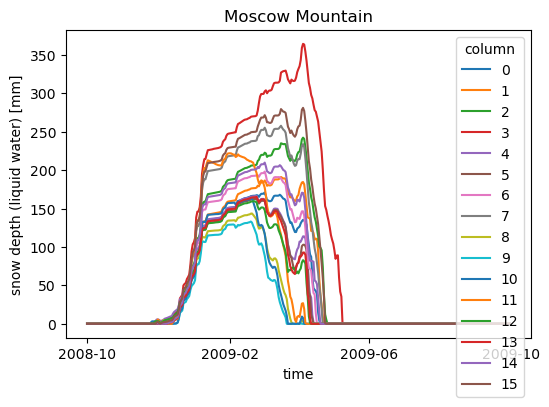

In [7]:
fig, axes = plt.subplots(nrows=1, ncols=1, sharey=True,figsize=[6,4])
plt.subplot(111)
y = 8
tslice = slice( (365*y),(365*(y+1)) )
ds.H2OSNO.isel(time=tslice).plot(hue='column') ;
#plt.ylim(0,850)
plt.title('Moscow Mountain') ;

**Aspect:**  (_ds.hillslope_aspect.values_)
- N = 0-3 
- E = 4-7  
- S = 8-11  
- W = 12-15 

**Elevation:**  (_ds.hillslope_elev.values_)
- Low 0, 4, 8, 12
- High 3, 7, 11, 15 

In [8]:
spd = 3600*24
ds['H2OSOI_3'] = ds.H2OSOI.isel(levsoi=2)
ds['PRECIP'] = (ds.RAIN + ds.SNOW)
ds['PRECIP'].attrs['units'] = 'mm/s'
ds['TBOT'] = ds.TBOT - 273.15
ds['TBOT'].attrs['units'] = 'degC'
#.hillslope_elev.values

In [9]:
ds['aspect'] = ['N','N','N','N',
                'E','E','E','E',
                'S','S','S','S',
                'W','W','W','W']

ds['elevation'] = [1,2,3,4, 1,2,3,4,
                   1,2,3,4, 1,2,3,4]

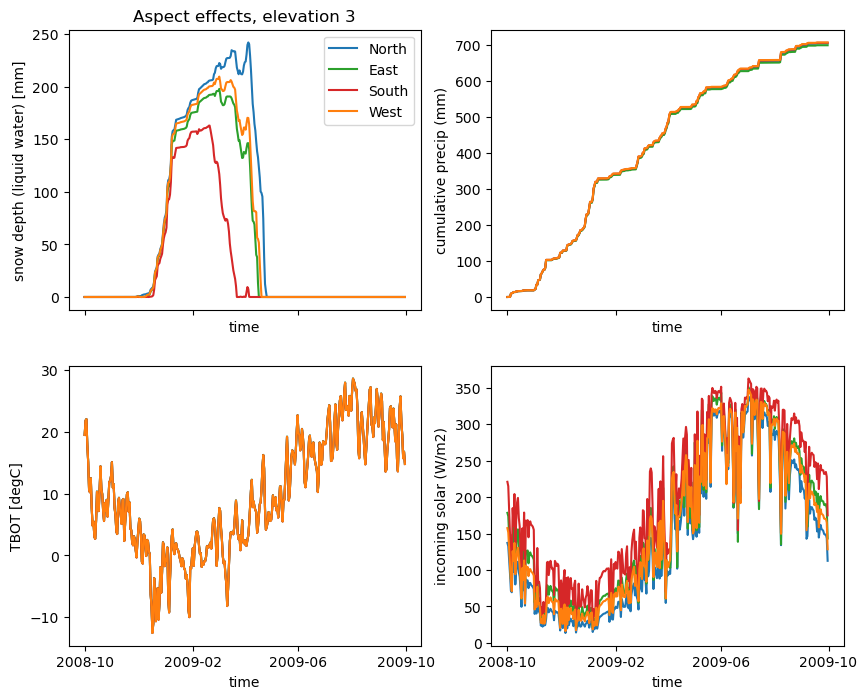

In [10]:
y = 8
var = ['H2OSNO','PRECIP','TBOT','FSDS']
col = [2,6,10,14]
label=['North','East','South','West']
colors=['tab:blue','tab:green','tab:red','tab:orange']
fig, axes = plt.subplots(nrows=2, ncols=2, sharex=True,figsize=[10,8])

for v in range(len(var)):
    plt.subplot(2, 2,(v+1))
    for c in range(len(col)):
        plotVar = ds[var[v]].isel(time=slice((y*365),((y+1)*365)), column=col[c])
        if v != 1:
            plotVar.plot(label=label[c], linestyle='-',color=colors[c])
            if v == 0:
                plt.legend()
                plt.title('Aspect effects, elevation 3')
            if v == 3:
                plt.ylabel("incoming solar (W/m2)")
        else:
            (plotVar*spd).cumsum().plot(label=label[c], linestyle='-',color=colors[c])
            plt.ylabel('cumulative precip (mm)');


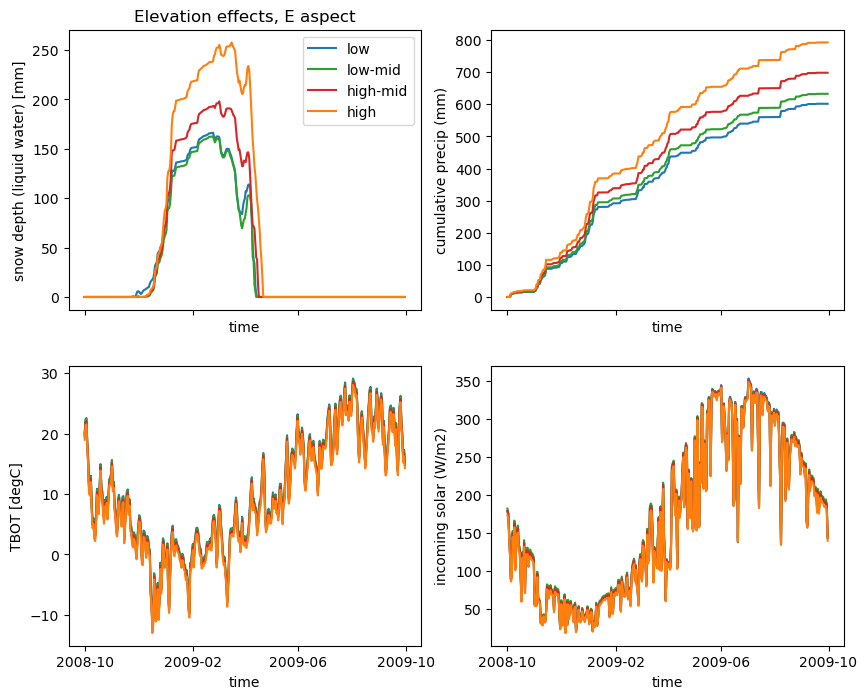

In [11]:
#var = ['H2OSNO','QRUNOFF']
col = [4,5,6,7]
label=['low','low-mid','high-mid','high']
lt = [':','-.','--','-']
fig, axes = plt.subplots(nrows=2, ncols=2, sharex=True,figsize=[10,8])

for v in range(len(var)):
    plt.subplot(2, 2,(v+1))
    for c in range(len(col)):
        plotVar = ds[var[v]].isel(time=slice((y*365),((y+1)*365)), column=col[c])
        if v != 1:
            plotVar.plot(label=label[c], linestyle='-', color=colors[c])
            if v == 0:
                plt.legend()
                plt.title('Elevation effects, E aspect')
            if v == 3:
                plt.ylabel("incoming solar (W/m2)")
        else:
            (plotVar*spd).cumsum().plot(label=label[c], linestyle='-',color=colors[c])
            plt.ylabel('cumulative precip (mm)');

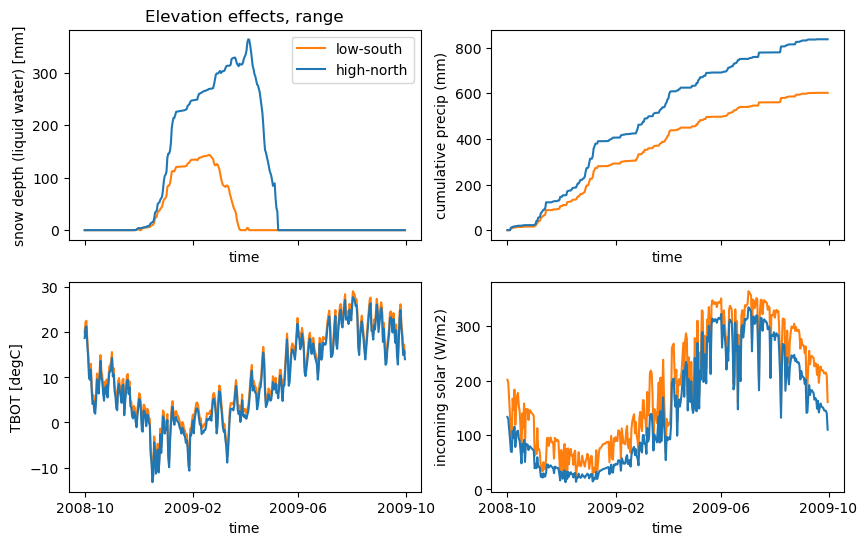

In [12]:
#var = ['SOILWATER_10CM','QRUNOFF']
col = [8, 3]
label=['low-south', 'high-north']
colors=['tab:orange','tab:blue']
lt = ['-','-']
fig, axes = plt.subplots(nrows=2, ncols=2, sharex=True,figsize=[10,6])

for v in range(len(var)):
    plt.subplot(2, 2,(v+1))
    for c in range(len(col)):
        plotVar = ds[var[v]].isel(time=slice((y*365),((y+1)*365)), column=col[c])
        if v != 1:
            plotVar.plot(label=label[c], linestyle='-', color=colors[c])
            if v == 0:
                plt.legend()
                plt.title('Elevation effects, range')
            if v == 3:
                plt.ylabel("incoming solar (W/m2)")
        else:
            (plotVar*spd).cumsum().plot(label=label[c], linestyle='-',color=colors[c])
            plt.ylabel('cumulative precip (mm)');

In [13]:
# drop end of datasets, for 20 water years of data, water years (2001-2020)

#print(ds.time[0])
#print(ds.time[shift-93])
#len(ds.time[0:(shift-93)])

ds = ds.isel(time=slice(0,(shift-93)))
ds['DOY'] = ds.time.dt.dayofyear


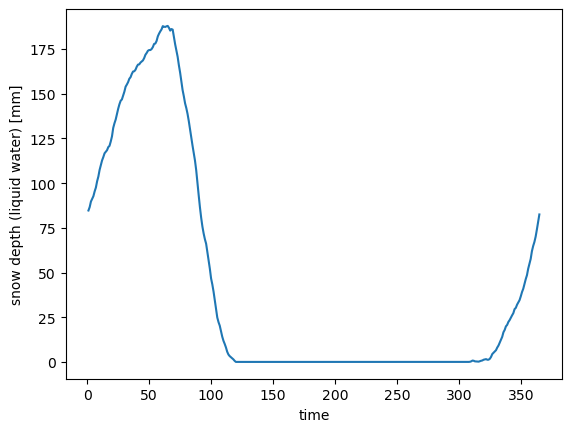

In [16]:
c=3
#x = ds.date[0:365]
y = ds.H2OSNO.isel(column=c).groupby(ds['DOY']).mean(dim=['time'])
y.plot()

## Quick look at SNOTEL observations for Niwot (station 663) and other sites in Boulder County
Data downloaded from https://wcc.sc.egov.usda.gov/reportGenerator/view/customMultiTimeSeriesGroupByStationReport/daily/start_of_period/663:CO:SNTL%7C838:CO:SNTL%7C412:CO:SNTL%7C1042:CO:SNTL%7C1251:CO:SNTL%7Cid=%22%22%7Cname/1990-10-01,2023-04-04/stationId,name,WTEQ::value,PREC::value?fitToScreen=false
- *Niwot* Elevation:	9,979 ft.
Latitude:	40.04
Longitude:	-105.55
- *University Camp* Elevation:	10,360 ft.
Latitude:	40.03
Longitude:	-105.58
- *Sawtooth* Elevation:	9,676 ft.
Latitude:	40.14
Longitude:	-105.58
- *Copeland Lake* Elevation:	8,555 ft.
Latitude:	40.21
Longitude:	-105.57
- *Wild Basin* Elevation:	9,439 ft.
Latitude:	40.2
Longitude:	-105.6

In [14]:
fin = '/glade/work/wwieder/modified_inputs/US-NR1/SNOTEL/SNOTEL_regional.csv' 
# Header = 61 rows 
df  = pd.read_csv(fin,skiprows=(61))
# To match simulations, starting in WY 2011: 
# first start obs in 2010, first 20 years (inc. 5 leap days)
# last day through Dec 31 2020
df  = df[((10*365)+3):(-916)]
df['Date'] = pd.to_datetime(df['Date'])
df = df[~((df.Date.dt.month == 2) & (df.Date.dt.day == 29))]

print(df.Date)

3653    2000-10-01
3654    2000-10-02
3655    2000-10-03
3656    2000-10-04
3657    2000-10-05
           ...    
10953   2020-09-26
10954   2020-09-27
10955   2020-09-28
10956   2020-09-29
10957   2020-09-30
Name: Date, Length: 7300, dtype: datetime64[ns]


In [15]:
# Get column names for SWE and accumulated precip data at each site
SWEcol = df.columns[[1,3,5,7,9]]
PPTcol = df.columns[[2,4,6,8,10]]
sites = ['Copeland','Niwot','Sawtooth','Univ Camp','Wild Basin']

# generate individual data frames for observations
SWE = df[SWEcol].set_index(pd.to_datetime(df['Date']))
PPT = df[PPTcol].set_index(pd.to_datetime(df['Date']))

# Now convert to xarray datasets
SWE = SWE.melt(value_vars=SWEcol, value_name='SWE', ignore_index=False) \
       .set_index('variable', append=True) \
       .to_xarray().rename({'Date': 'date','variable': 'site'}) \
       .assign_coords({"site": sites})

PPT = PPT.melt(value_vars=PPTcol, value_name='PPT', ignore_index=False) \
       .set_index('variable', append=True) \
       .to_xarray().rename({'Date': 'date','variable': 'site'}) \
       .assign_coords({"site": sites})
OBS = xr.merge([SWE,PPT])
OBS

<xarray.Dataset>
Dimensions:  (date: 7300, site: 5)
Coordinates:
  * date     (date) datetime64[ns] 2000-10-01 2000-10-02 ... 2020-09-30
  * site     (site) <U10 'Copeland' 'Niwot' 'Sawtooth' 'Univ Camp' 'Wild Basin'
Data variables:
    SWE      (date, site) float64 0.0 0.0 nan 0.0 nan ... 0.0 0.0 0.0 0.0 0.0
    PPT      (date, site) float64 0.0 0.0 nan 0.0 nan ... 28.1 39.8 31.6 27.2

In [16]:
# Change units and add some metadata
OBS['SWE'] = OBS.SWE * 25.4
OBS['PPT'] = OBS.PPT * 25.4
OBS['SWE'].attrs['Long_name']='Snow Water Equilivent'
OBS['SWE'].attrs['units']='mm'
OBS['PPT'].attrs['Long_name']='Accumulated precipitation'
OBS['PPT'].attrs['units']='mm'

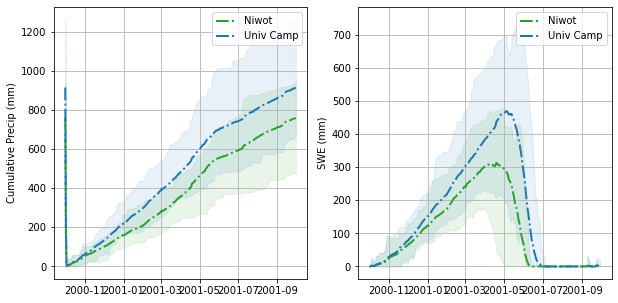

In [17]:
OBS['DOY'] = (OBS.date.dt.dayofyear )
# rearrange for water year
OBS['DOY'] = xr.where((OBS['DOY']<(-shift)), 
                      (OBS['DOY']+(365+shift)),(OBS['DOY']+shift))
climo = OBS.groupby(OBS['DOY']).mean(dim='date')
SD = OBS.groupby(OBS['DOY']).std(dim='date')
MIN = OBS.groupby(OBS['DOY']).min(dim='date')
MAX = OBS.groupby(OBS['DOY']).max(dim='date')
# make x-axis date-time again
climo['DWY'] = OBS.date[0:365]

x = climo['DWY']#.dt.strftime("%b %d")
#print(x)
color=['tab:green','tab:blue']
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=[10,5],sharex=True)
OBSvars = ['PPT','SWE']

for v in [0,1]:
    j=0
    plt.subplot(1,2,(v+1))
    for i in [1,3]:
        y = climo[OBSvars[v]].isel(site=i)
        y2 = SD[OBSvars[v]].isel(site=i)
        y3 = MIN[OBSvars[v]].isel(site=i)
        y4 = MAX[OBSvars[v]].isel(site=i)
        plt.plot(x,y, label=sites[i],color=color[j],linewidth=2, linestyle='-.')
        plt.fill_between(x, y3, y4, alpha=0.1, color=color[j])
        #plt.plot(x, y3, color=color[j],linewidth=0.8)
        #plt.plot(x, y4, color=color[j],linewidth=0.8)
        j=j+1
    plt.grid(True)
    plt.legend()
    if v == 0: plt.ylabel('Cumulative Precip (mm)');
    if v == 1: plt.ylabel('SWE (mm)');


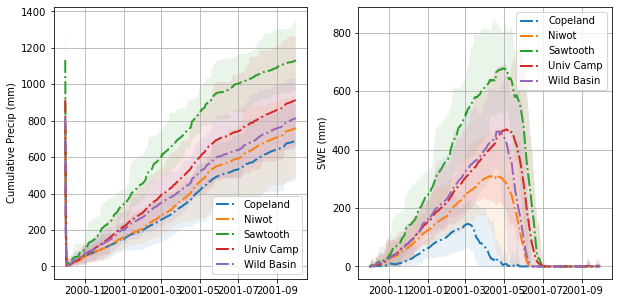

In [18]:
x = climo['DWY']#.dt.strftime("%b %d")
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=[10,5],sharex=True)
OBSvars = ['PPT','SWE']

for v in [0,1]:
    j=0
    plt.subplot(1,2,(v+1))
    for i in range(len(OBS.site)):
        y = climo[OBSvars[v]].isel(site=i)
        y2 = SD[OBSvars[v]].isel(site=i)
        y3 = MIN[OBSvars[v]].isel(site=i)
        y4 = MAX[OBSvars[v]].isel(site=i)
        plt.plot(x,y, label=sites[i], linewidth=2, linestyle='-.')
        plt.fill_between(x, y3, y4, alpha=0.1)
        j=j+1
    plt.grid(True)
    plt.legend()
    if v == 0: plt.ylabel('Cumulative Precip (mm)');
    if v == 1: plt.ylabel('SWE (mm)');


In [19]:
# sum PPT for model runs
ds['PPT'] = (ds['RAIN']+ds['SNOW'] )*60*60*24 #convert from mm/s to mm/d
ds2['PPT'] = (ds2['RAIN']+ds2['SNOW'])*60*60*24
ds['QRUNOFF'] = ds['QRUNOFF']*60*60*24 #convert from mm/s to mm/d
ds2['QRUNOFF'] = ds2['QRUNOFF']*60*60*24 #convert from mm/s to mm/d

ds = ds.load()
ds2 = ds2.load()

In [20]:
ds['DOY'] = ds.time.dt.dayofyear
# rearrange for water year
ds['DOY'] = xr.where((ds['DOY']<(-shift)), 
                     (ds['DOY']+(365+shift)),(ds['DOY']+shift))

2000, CLM max = 122.0, OBS max = 249.0
2001, CLM max = 68.0, OBS max = 178.0
2002, CLM max = 265.0, OBS max = 401.0
2003, CLM max = 165.0, OBS max = 295.0
2004, CLM max = 289.0, OBS max = 340.0
2005, CLM max = 236.0, OBS max = 325.0
2006, CLM max = 275.0, OBS max = 455.0
2007, CLM max = 334.0, OBS max = 378.0
2008, CLM max = 351.0, OBS max = 406.0
2009, CLM max = 298.0, OBS max = 318.0
2010, CLM max = 429.0, OBS max = 432.0
2011, CLM max = 226.0, OBS max = 279.0
2012, CLM max = 362.0, OBS max = 424.0
2013, CLM max = 468.0, OBS max = 470.0
2014, CLM max = 297.0, OBS max = 361.0
2015, CLM max = 361.0, OBS max = 419.0
2016, CLM max = 339.0, OBS max = 386.0
2017, CLM max = 244.0, OBS max = 307.0
2018, CLM max = 323.0, OBS max = 340.0
2019, CLM max = 318.0, OBS max = 480.0


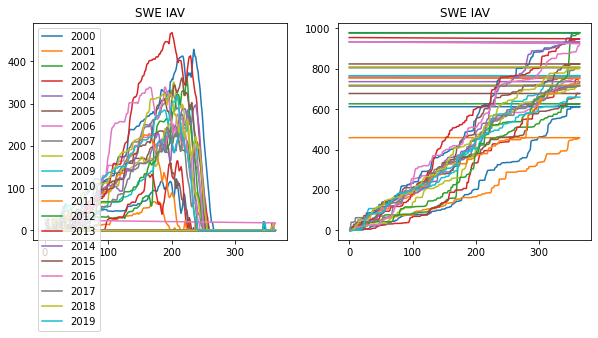

In [21]:
var = ['H2OSNO','PPT']
fig, axes = plt.subplots(nrows=1, ncols=2, sharey=True,figsize=[10,4])

for v in range(len(var)):
    plt.subplot(1,2,(v+1))
    for i in range(20):
        plotX = ds['DOY'].isel(time=slice((365*i),(365*(i+1))))
        plotY = ds[var[v]].isel(time=slice((365*i),(365*(i+1))), column=6)
        plotZ = OBS['SWE'].isel(date=slice((365*i),(365*(i+1))), site=1)
        if v == 0: 
            print(str(2000+i)+", CLM max = "+str(np.round(plotY.max().values,0)) \
                             +", OBS max = "+str(np.round(plotZ.max().values,0)))
            plt.plot(plotX,plotY,label=(2000+i))
            plt.title('SWE IAV')
            plt.legend() 
        else:
            plotY.cumsum()
            plt.plot(plotX,plotY.cumsum(),label=(2000+i))
            plt.title('SWE IAV')
            #plt.legend() 
            #(plotVar*3600*24).cumsum().plot(label=label[c],color=colors[1],linestyle=lt[c])
            #plt.ylabel('Total Liquid Runoff [mm]');



[2000, 2001, 2002, 2003, 2004, 2005, 2006]
[2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]


Text(0, 0.5, 'CLM max SWE bias (mm)')

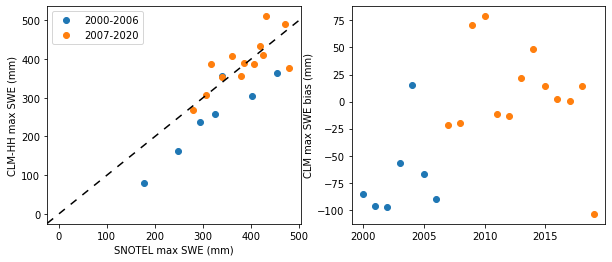

In [26]:
var = ['H2OSNO']

x,y,z = [],[],[]
for i in range(20):
    y.append(ds['H2OSNO'].isel(time=slice((365*i),(365*(i+1))), column=2).max().values)
    x.append(OBS['SWE'].isel(date=slice((365*i),(365*(i+1))), site=1).max().values)
    z.append(2000+i)
print(z[0:7])
print(z[7:22])

fig, axes = plt.subplots(nrows=1, ncols=2, sharey=True,figsize=[10,4])
plt.subplot(121)
plt.plot(x[0:7], y[0:7],'o',label="2000-2006")
plt.plot(x[7:22], y[7:22],'o',label="2007-2020")
plt.ylabel("CLM-HH max SWE (mm)")
plt.xlabel("SNOTEL max SWE (mm)")
plt.axline((0, 0), slope=1., color="black", linestyle=(0, (5, 5)))
plt.legend() ;    
q =np.array(y)-np.array(x)
plt.subplot(122)
plt.plot(z[0:7], q[0:7],'o',label="2000-2006")
plt.plot(z[7:21], q[7:22],'o',label="2007-2020")
plt.ylabel("CLM max SWE bias (mm)")


[2000, 2001, 2002, 2003, 2004, 2005, 2006]
[2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]


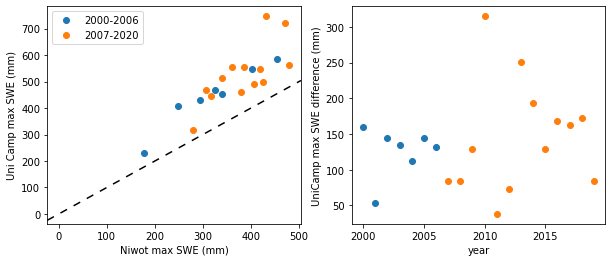

In [27]:
var = ['H2OSNO']

x,y,z = [],[],[]
for i in range(20):
    y.append(OBS['SWE'].isel(date=slice((365*i),(365*(i+1))), site=3).max().values)
    x.append(OBS['SWE'].isel(date=slice((365*i),(365*(i+1))), site=1).max().values)
    z.append(2000+i)
print(z[0:7])
print(z[7:22])

fig, axes = plt.subplots(nrows=1, ncols=2, sharey=True,figsize=[10,4])
plt.subplot(121)
plt.plot(x[0:7], y[0:7],'o',label="2000-2006")
plt.plot(x[7:22], y[7:22],'o',label="2007-2020")
plt.ylabel("Uni Camp max SWE (mm)")
plt.xlabel("Niwot max SWE (mm)")
plt.axline((0, 0), slope=1., color="black", linestyle=(0, (5, 5)))
plt.legend() ;    
q =np.array(y)-np.array(x)
plt.subplot(122)
plt.plot(z[0:7], q[0:7],'o',label="2000-2006")
plt.plot(z[7:21], q[7:22],'o',label="2007-2020")
plt.xlabel("year")
plt.ylabel("UniCamp max SWE difference (mm)") ;

#### results prior to 2007 look pretty bad, drop these years?

In [28]:
#ds = ds.isel(time=slice((365*6),None))
#ds2 = ds2.isel(time=slice((365*6),None)) # for consistency
#OBS = OBS.isel(date=slice((365*6),None))

In [29]:
var = ['PPT','H2OSNO','QRUNOFF']
c=2
climo_ds = ds[var].isel(column=c).groupby(ds['DOY']).mean(dim=['time'])
SD_ds  = ds[var].isel(column=c).groupby(ds['DOY']).std(dim=['time'])
MIN_ds = ds[var].isel(column=c).groupby(ds['DOY']).min(dim=['time'])
MAX_ds = ds[var].isel(column=c).groupby(ds['DOY']).max(dim=['time'])
climo_ds['DWY'] = ds.time[0:365]

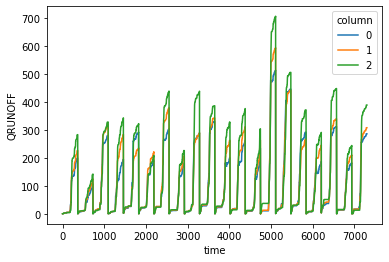

In [30]:
# create an array of years (modify day/month for your use case)
my_years = xr.DataArray([t.year if ((t.month < 10 ) ) else (t.year + 1) for t in ds.indexes['time']],
                        dims='time', name='my_years', coords={'time': ds.time})

# use that array of years (integers) to do the groupby
ds_cumsum = ds[var].groupby(my_years).apply(lambda x: x.cumsum(dim='time', skipna=True))
ds_cumsum2 = ds2[var].groupby(my_years).apply(lambda x: x.cumsum(dim='time', skipna=True))
ds_cumsum.QRUNOFF.isel(column=slice(4,7)).plot(hue='column') ;

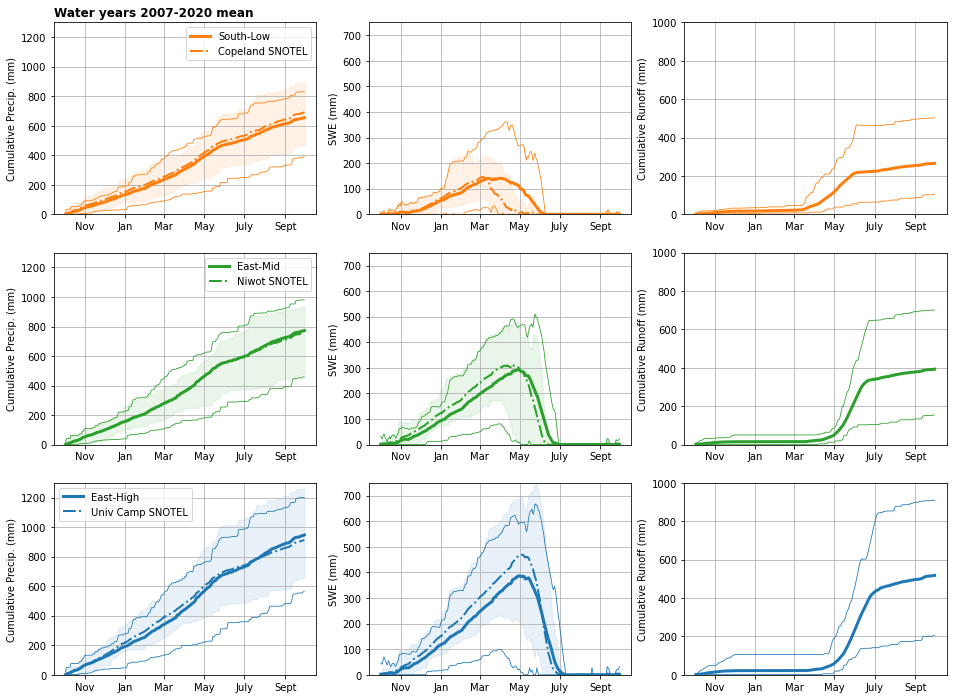

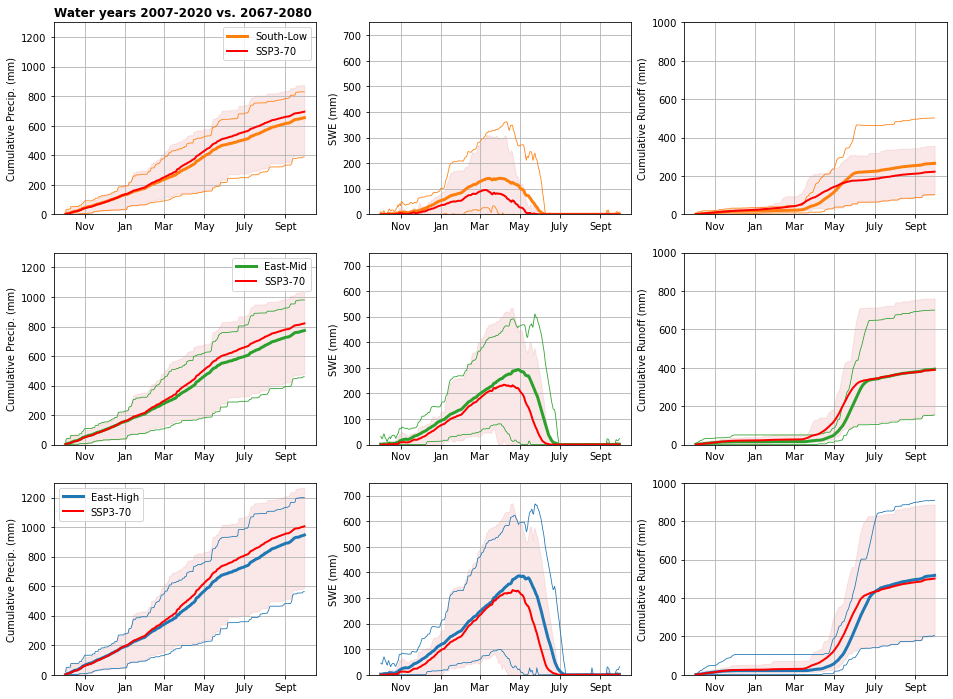

In [31]:
color=['tab:orange','tab:green','tab:blue']
OBSvars = ['PPT','SWE']
cols = ['South-Low','East-Mid','East-High']

for z in [0,1]:
    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=[16,12],sharex=True)
    j,p=0,0
    ax = plt.gca()
    for i in [0,1,3]:
        for v in [0,1,2]:
            x = climo['DWY']
            if v == 0 or v == 2:
                x=x[2:]
            p = p+1 
            plt.subplot(3,3,p)
            if i ==0: c=8
            if i ==1: c=6
            if i ==3: c=7
            if v == 1: 
                din = ds[var[v]]
                din2= ds2[var[v]]
            else: 
                din = ds_cumsum[var[v]]
                din2 = ds_cumsum2[var[v]]
            y = din.isel(column=c).groupby(ds['DOY']).mean(dim=['time'])
            y2 = din2.isel(column=c).groupby(ds['DOY']).mean(dim=['time'])
            y2b = din2.isel(column=c).groupby(ds['DOY']).min(dim=['time'])
            y2c = din2.isel(column=c).groupby(ds['DOY']).max(dim=['time'])
            y3 = din.isel(column=c).groupby(ds['DOY']).min(dim=['time'])
            y4 = din.isel(column=c).groupby(ds['DOY']).max(dim=['time'])
            if v == 0 or v == 2:
                y=y[2:]
                y2=y2[2:]
                y2b=y2b[2:]
                y2c=y2c[2:]
                y3=y3[2:]
                y4=y4[2:]
            plt.plot(x,y,label=cols[j],color=color[j], linewidth=3)
            plt.plot(x,y3,label=None,color=color[j],
                     linewidth=0.8, linestyle='-')
            plt.plot(x,y4,label=None,color=color[j],
                     linewidth=0.8, linestyle='-')
            if z == 1: # Future scenario
                plt.plot(x,y2,label='SSP3-70',color='red', linewidth=2)
                plt.fill_between(x, y2b, y2c, alpha=0.1, color='tab:red')
                #plt.plot(x,y2b,label=None,color='red', linewidth=0.8)
                #plt.plot(x,y2c,label=None,color='red', linewidth=0.8)
            else:  # Now add the SNOTEL sites            
                if v<2:
                    din = OBS[OBSvars[v]]

                    y = din.groupby(OBS['DOY']).mean(dim='date').isel(site=i)
                    y3 = din.groupby(OBS['DOY']).min(dim='date').isel(site=i)
                    y4 = din.groupby(OBS['DOY']).max(dim='date').isel(site=i)
                    if v == 0:
                        y=y[2:]
                        y3=y3[2:]
                        y4=y4[2:]
                    plt.plot(x,y,label=sites[i]+' SNOTEL',color=color[j],
                             linewidth=2, linestyle='-.')
                    plt.fill_between(x, y3, y4, alpha=0.1, color=color[j])
            plt.grid(True)
            # X ticks control
            locs, labels = plt.xticks()
            plt.xticks(ticks=locs, labels=['Nov','Jan','Mar','May','July','Sept'])

            if v == 0: 
                if j == 0:
                    if z == 0: 
                        plt.title('Water years 2007-2020 mean',
                                  loc='left', fontsize='large', fontweight='bold')
                    else: 
                        plt.title('Water years 2007-2020 vs. 2067-2080',
                                  loc='left', fontsize='large', fontweight='bold')
                plt.ylabel('Cumulative Precip. (mm)')
                plt.ylim([0, 1300])
                plt.legend()
            if v == 1: 
                plt.ylabel('SWE (mm)');
                plt.ylim([0, 750])
            if v == 2: 
                plt.ylabel('Cumulative Runoff (mm)')
                plt.ylim([0, 1000]);
        j=j+1



## make a smaller set of plots for presentation?

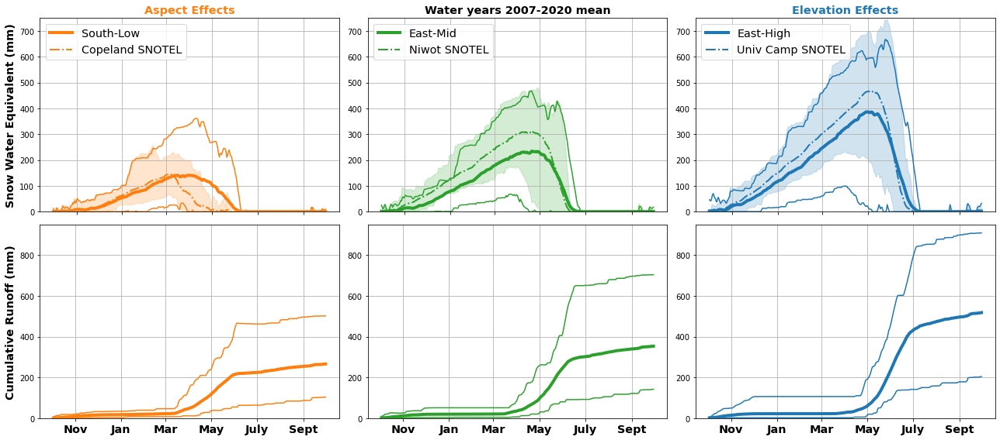

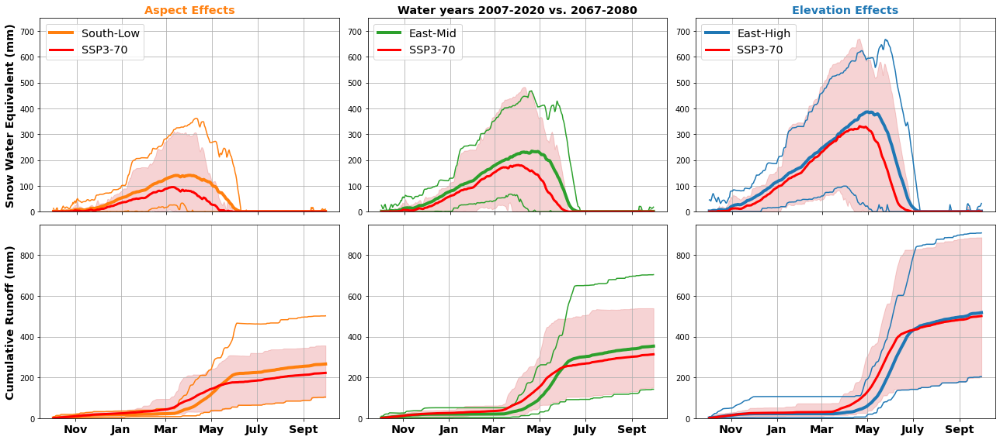

In [34]:
color=['tab:orange','tab:green','tab:blue']
OBSvars = ['PPT','SWE']
cols = ['South-Low','East-Mid','East-High']
P = [1,4,2,5,3,6]
for z in [0,1]:
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=[18,8],sharex=True,sharey=True)
    j,p=0,-1
    ax = plt.gca()
    for i in [0,1,3]:
        for v in [1,2]:
            x = climo['DWY']
            if v == 0 or v == 2:
                x=x[2:]
            p = p+1 
            plt.subplot(2,3,P[p])
            if i ==0: c=8
            if i ==1: c=6
            if i ==3: c=7
            if v == 1: 
                din = ds[var[v]]
                din2= ds2[var[v]]
            else: 
                din = ds_cumsum[var[v]]
                din2 = ds_cumsum2[var[v]]
            y = din.isel(column=c).groupby(ds['DOY']).mean(dim=['time'])
            y2 = din2.isel(column=c).groupby(ds['DOY']).mean(dim=['time'])
            y2b = din2.isel(column=c).groupby(ds['DOY']).min(dim=['time'])
            y2c = din2.isel(column=c).groupby(ds['DOY']).max(dim=['time'])
            y3 = din.isel(column=c).groupby(ds['DOY']).min(dim=['time'])
            y4 = din.isel(column=c).groupby(ds['DOY']).max(dim=['time'])
            if v == 0 or v == 2:
                y=y[2:]
                y2=y2[2:]
                y2b=y2b[2:]
                y2c=y2c[2:]
                y3=y3[2:]
                y4=y4[2:]
            plt.plot(x,y,label=cols[j],color=color[j], linewidth=4)
            plt.plot(x,y3,label=None,color=color[j],
                     linewidth=1.5, linestyle='-')
            plt.plot(x,y4,label=None,color=color[j],
                     linewidth=1.5, linestyle='-')
            if z == 1: # Future scenario
                plt.plot(x,y2,label='SSP3-70',color='red', linewidth=3)
                plt.fill_between(x, y2b, y2c, alpha=0.2, color='tab:red')
                #plt.plot(x,y2b,label=None,color='red', linewidth=0.8)
                #plt.plot(x,y2c,label=None,color='red', linewidth=0.8)
            else:  # Now add the SNOTEL sites            
                if v<2:
                    din = OBS[OBSvars[v]]

                    y = din.groupby(OBS['DOY']).mean(dim='date').isel(site=i)
                    y3 = din.groupby(OBS['DOY']).min(dim='date').isel(site=i)
                    y4 = din.groupby(OBS['DOY']).max(dim='date').isel(site=i)
                    if v == 0:
                        y=y[2:]
                        y3=y3[2:]
                        y4=y4[2:]
                    plt.plot(x,y,label=sites[i]+' SNOTEL',color=color[j],
                             linewidth=2, linestyle='-.')
                    plt.fill_between(x, y3, y4, alpha=0.2, color=color[j])
            plt.grid(True)
            # X ticks control
            locs, labels = plt.xticks()
            plt.xticks(ticks=locs, labels=['','','','','',''])

            if v == 1: 
                if j == 0:
                    plt.title('Aspect Effects', color=color[j],
                              loc='center', fontsize='x-large', fontweight='bold')
                if j == 2:
                    plt.title('Elevation Effects', color=color[j],
                              loc='center', fontsize='x-large', fontweight='bold')
                if j == 1:
                    if z == 0: 
                        plt.title('Water years 2007-2020 mean',
                                  loc='center', fontsize='x-large', fontweight='bold')
                    else: 
                        plt.title('Water years 2007-2020 vs. 2067-2080',
                                  loc='center', fontsize='x-large', fontweight='bold')
                        
                plt.ylabel('Cumulative Precip. (mm)', fontsize='x-large', fontweight='bold')
                plt.ylim([0, 1300])
                plt.legend(loc='upper left',fontsize='x-large')
            else:
                plt.xticks(ticks=locs, labels=['Nov','Jan','Mar','May','July','Sept'], 
                           fontsize='x-large', fontweight='bold')

            if v == 1: 
                if p ==0:
                    plt.ylabel('Snow Water Equivalent (mm)', fontsize='x-large', fontweight='bold');
                else:
                    plt.ylabel(None)
                plt.ylim([0, 750])
                
            if v == 2: 
                if p==1:
                    plt.ylabel('Cumulative Runoff (mm)', fontsize='x-large', fontweight='bold')
                plt.ylim([0, 950]);

        fig.tight_layout()
        j=j+1



<xarray.DataArray 'H2OSNO' (year: 14)>
array([274.14474, 332.00403, 359.067  , 285.96268, 415.65964, 237.51782,
       350.01797, 457.94962, 269.18802, 367.8046 , 353.23965, 248.64105,
       324.326  , 335.61356], dtype=float32)
Coordinates:
  * year     (year) int64 2007 2008 2009 2010 2011 ... 2016 2017 2018 2019 2020


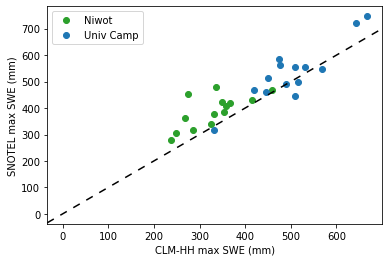

In [26]:
# First water year of value is bad value and should be removed
x = ds.H2OSNO.groupby(ds.time.dt.year).max().isel(year=slice(1,None),column=6)#.plot(hue='column') ;
x2 = ds.H2OSNO.groupby(ds.time.dt.year).max().isel(year=slice(1,None),column=7)#.plot(hue='column') ;
y = OBS.SWE.groupby(OBS.date.dt.year).max().isel(year=slice(1,None),site=1)
y2 = OBS.SWE.groupby(OBS.date.dt.year).max().isel(year=slice(1,None),site=3)
plt.plot(x,y,'o',color='tab:green',label=OBS.site[1].values)
plt.plot(x2,y2,'o',color='tab:blue',label=OBS.site[3].values) 
plt.xlabel("CLM-HH max SWE (mm)")
plt.ylabel("SNOTEL max SWE (mm)")
plt.axline((0, 0), slope=1., color="black", linestyle=(0, (5, 5)))
plt.legend() ;
print(x)

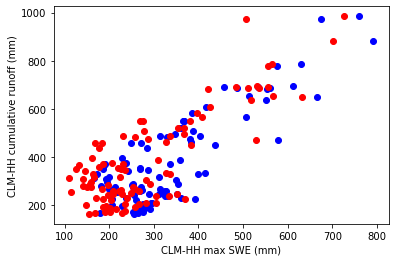

In [27]:
# First water year of runoff is bad value and should be removed
c1, c2 = 0, 7 # N aspect
x = ds.H2OSNO.groupby(ds.time.dt.year).max().isel(year=slice(1,None),column=slice(c1,c2))
x2 = ds2.H2OSNO.groupby(ds.time.dt.year).max().isel(year=slice(1,None),column=slice(c1,c2))
y = ds_cumsum.QRUNOFF.groupby(ds.time.dt.year).max().isel(year=slice(1,None),column=slice(c1,c2))
y2 = ds_cumsum.QRUNOFF.groupby(ds.time.dt.year).max().isel(year=slice(1,None),column=slice(c1,c2))
plt.plot(x,y,'o',color='blue') ;
plt.plot(x2,y2,'o',color='red') ;
plt.xlabel("CLM-HH max SWE (mm)")
plt.ylabel("CLM-HH cumulative runoff (mm)") ;


## remap colums to DEM


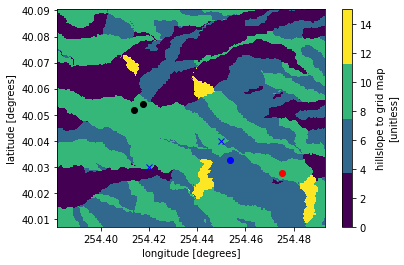

In [28]:
ds_grid = '/glade/scratch/wwieder/map_hillslope_to_grid_NR.nc'
ds_grid = xr.open_dataset(ds_grid)
ds_grid['lat'] = ds_grid.latitude
ds_grid['lon'] = ds_grid.longitude
ds_grid = ds_grid.isel(lon=slice(250,650),lat=slice(350,650))
cmap = plt.get_cmap('viridis',4)
ds_grid.hillslope_to_grid.plot(cmap=cmap) ;

loc = ['US-NR1' ,'Niwot','Uni Camp', 'NEON'   ,'US-NR3' ,'Sourdough']
lat = [40.0329  , 40.04 ,40.03     ,40.05425  ,40.0520  ,40.027854]
lon = [-105.5464,-105.55,-105.58   ,-105.58237,-105.5864,-105.525]
color=['blue'   ,'blue' ,'blue'    ,'black'   ,'black'  ,'red' ]
sign =['o'      ,'x'    ,'x'       ,'o'       ,'o'      ,'o']

for i in range(len(loc)):
    x = ds_grid.longitude.sel(lon=(360+lon[i]),method='nearest')
    y = ds_grid.latitude.sel(lat=lat[i],method='nearest')
    plt.plot(x,y,sign[i],color=color[i])

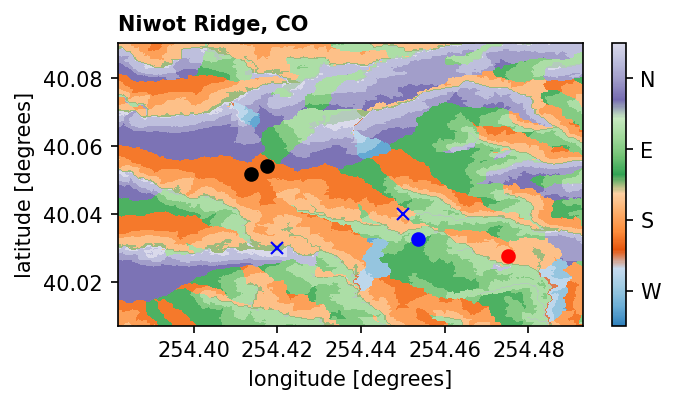

In [29]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=16):
    new_cmap = mcolors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

cmap = plt.get_cmap('tab20c_r',20)
new_cmap = truncate_colormap(cmap, 0.2, 1., 16)
cmap = plt.get_cmap('viridis',4)

data = ds_grid.hillslope_to_grid.astype("int")

# Add colorbar, make sure to specify tick locations to match desired ticklabels
levels =[2, 6, 10, 14]
labels = ['N', 'E', 'S','W']

fig = plt.figure(figsize=(5., 2.5), dpi=150.)
ax = fig.add_subplot(111)

cax = data.plot(cmap=new_cmap, ax=ax,
          vmin=0, vmax=16, robust=False,
          add_colorbar=False)

cbar = fig.colorbar(cax, ticks=levels)
cbar.ax.set_yticklabels(labels)
cbar.ax.invert_yaxis()

plt.title('Niwot Ridge, CO',
          loc='left', fontsize='medium', fontweight='bold')

for i in range(len(loc)):
    x = ds_grid.longitude.sel(lon=(360+lon[i]),method='nearest')
    y = ds_grid.latitude.sel(lat=lat[i],method='nearest')
    plt.plot(x,y,sign[i],color=color[i])


In [30]:
ds_grid['H2OSNO'] = ds_grid.hillslope_to_grid
ds_grid['hh_grid'] = ds_grid.hillslope_to_grid.astype("int")

for i in range(len(ds.column)):
    ds_grid['H2OSNO'] = xr.where(ds_grid['hh_grid'] == i, ds.H2OSNO.isel(column=i), ds_grid['H2OSNO'])
    
ds_grid.load()

<xarray.Dataset>
Dimensions:            (lat: 300, lon: 400, naspect: 4, nhand: 5, time: 5109)
Coordinates:
  * lat                (lat) float64 40.09 40.09 40.09 ... 40.01 40.01 40.01
  * lon                (lon) float64 254.4 254.4 254.4 ... 254.5 254.5 254.5
  * time               (time) object 2006-10-01 00:00:00 ... 2020-09-29 00:00:00
Dimensions without coordinates: naspect, nhand
Data variables:
    longitude          (lon) float64 254.4 254.4 254.4 ... 254.5 254.5 254.5
    latitude           (lat) float64 40.09 40.09 40.09 ... 40.01 40.01 40.01
    aspect_bins        (naspect) float64 0.0 90.0 180.0 270.0
    hand_bins          (nhand) float64 0.0 2.0 59.0 144.0 1e+06
    hillslope_to_grid  (lat, lon) float64 9.0 9.0 9.0 9.0 ... 11.0 11.0 11.0
    H2OSNO             (lat, lon, time) float64 0.0 1.027e-05 ... 0.0 1.601e-08
    hh_grid            (lat, lon) int64 9 9 9 9 9 9 9 9 ... 10 11 11 11 11 11 11
Attributes:
    note:     outer loop over aspect, inner loop over hand bins

In [31]:
ds.H2OSNO

<xarray.DataArray 'H2OSNO' (time: 5109, column: 16)>
array([[0.0000000e+00, 7.1864738e-06, 3.7713697e-05, ..., 0.0000000e+00,
        0.0000000e+00, 2.0520271e-04],
       [1.4225031e-04, 3.3411747e-04, 3.8038002e-04, ..., 2.1737939e-04,
        5.4398643e-05, 1.1630326e-03],
       [0.0000000e+00, 9.8438642e-05, 4.9380196e-04, ..., 0.0000000e+00,
        0.0000000e+00, 1.0783371e-03],
       ...,
       [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       [5.2950866e-10, 2.5781993e-08, 2.8402726e-06, ..., 5.5602385e-07,
        2.5397576e-06, 2.7035780e-05]], dtype=float32)
Coordinates:
  * time     (time) object 2006-10-01 00:00:00 ... 2020-09-29 00:00:00
Dimensions without coordinates: column
Attributes:
    long_name:     snow depth (liquid water)
    units:         mm
    cell_methods:  time: mean

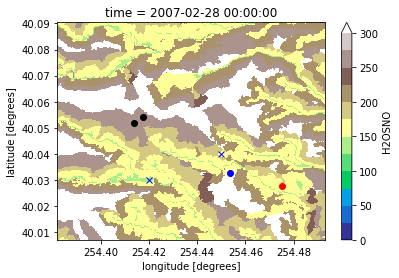

In [32]:
ds_grid['H2OSNO'].isel(time=150).plot(
    cmap='terrain',vmax=300,vmin=0,levels=13);

for i in range(len(loc)):
    x = ds_grid.longitude.sel(lon=(360+lon[i]),method='nearest')
    y = ds_grid.latitude.sel(lat=lat[i],method='nearest')
    plt.plot(x,y,sign[i],color=color[i])


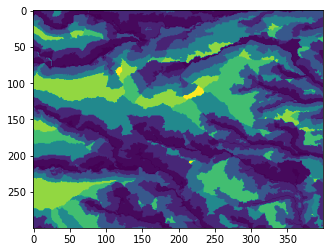

In [33]:
import matplotlib.animation as animation
# ims is a list of lists, each row is a list of artists to draw in the
# current frame; here we are just animating one artist, the image, in
# each frame
fig, ax = plt.subplots()

ims = []
for i in range(6):
    im = ax.imshow(ds_grid['H2OSNO'].isel(time=(100+i)), animated=True)
    if i == 0:
        ax.imshow(ds_grid['H2OSNO'].isel(time=(100+i)))  # show an initial one first
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=1000)

# To save the animation, use e.g.
#
# ani.save("movie.mp4")
#
# or
#
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

plt.show()

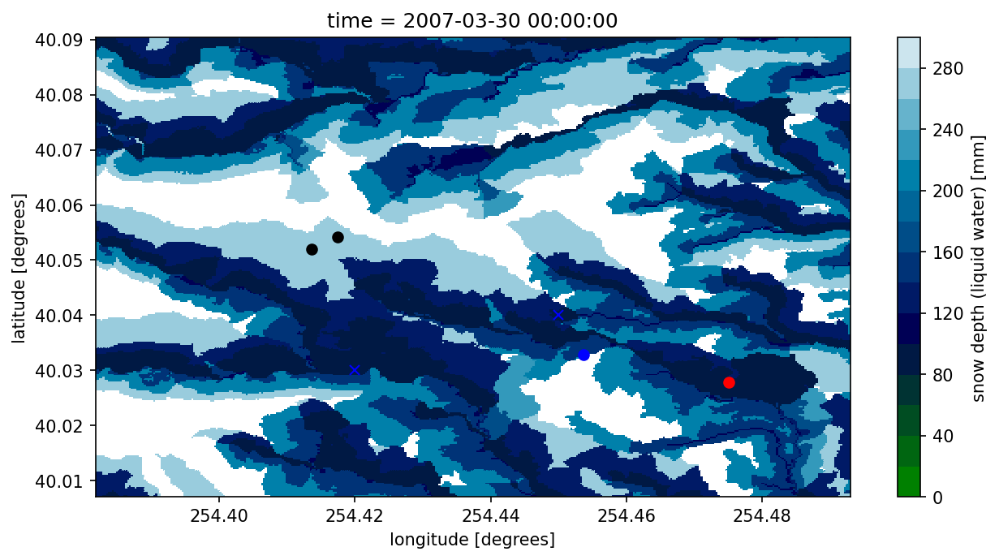

In [34]:
#Trying this examples from https://climate-cms.org/posts/2019-09-03-python-animation.html

# Get a handle on the figure and the axes
tas = ds_grid['H2OSNO']
tas.attrs = ds.H2OSNO.attrs
fig, ax = plt.subplots(figsize=(10,5), dpi=150.)

# Plot the initial frame. 
cax = tas[:,:,180].plot(
    add_colorbar=True,
    #cmap='cubehelix',
    cmap='ocean',
    vmax=300,vmin=0,
    levels=16,
    cbar_kwargs={
        'extend':'neither'
    }
)
for i in range(len(loc)):
    x = ds_grid.longitude.sel(lon=(360+lon[i]),method='nearest')
    y = ds_grid.latitude.sel(lat=lat[i],method='nearest')
    plt.plot(x,y,sign[i],color=color[i])

# Next we need to create a function that updates the values for the colormesh, as well as the title.
def animate(frame):
    cax.set_array(tas[:,:,(180+frame)].values.flatten())
    ax.set_title("Time = " + str(tas.coords['time'].values[(180+frame)])[:13])

# Finally, we use the animation module to create the animation.
ani = animation.FuncAnimation(
    fig,             # figure
    animate,         # name of the function above
    frames=90,       # Could also be iterable or list
    interval=500     # ms between frames
)

In [35]:
display(HTML(ani.to_jshtml())) 


In [36]:
#ani.to_html5_video()
writergif = animation.PillowWriter(fps=6)
ani.save('/glade/scratch/wwieder/animations/Python_Animation_05.gif',writer=writergif)

FFwriter = animation.FFMpegWriter(fps=30, bitrate=2000)
ani.save('/glade/scratch/wwieder/animations/Python_Animation_04.mp4', writer=FFwriter)

In [48]:
#ani.save()
display(HTML("<video controls><source src='/glade/scratch/wwieder/animations/Python_Animation_04.gif' type='video/gif'></video>"))

In [20]:
for i in range(40):
    ds_grid['H2OSNO'].isel(time=(100+i)).plot(
        figsize = (12,6)      # We'll make it a bit bigger
    )
    plt.title("Time = " + str(ds_grid.coords['time'].values[(100+i)])[:13])
    plt.savefig(f"/glade/scratch/wwieder/animations/Python_Animation_01_frame_{i:04}.png")
    plt.close()

In [35]:
!convert /glade/scratch/wwieder/animations/Python_Animation_01_frame_*.png /glade/scratch/wwieder/animations/Python_Animation_01_frame_*.gif
display(HTML("<img src='/glade/scratch/wwieder/animations/Python_Animation_01_frame_*.gif' />"))

NameError: name 'HTML' is not defined

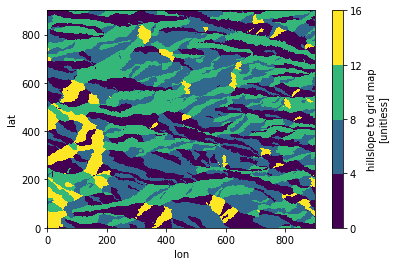

In [17]:
ds_grid.hillslope_to_grid.plot(levels=5) ;

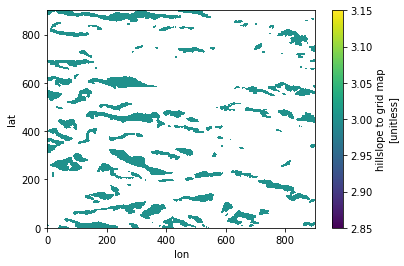

In [18]:
ds_grid.hillslope_to_grid.where(ds_grid.hillslope_to_grid==3).plot()

#### Quick look at LAI modifications for US-NR1

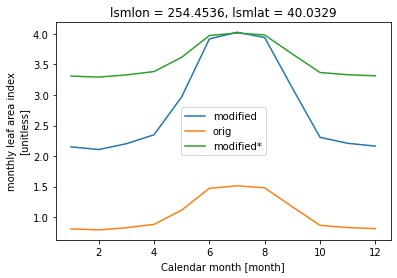

In [9]:
surDat = '/glade/scratch/wwieder/US-NR1_single_point_data/surfdata_0.9x1.25_hist_16pfts_Irrig_CMIP6_simyr2000_US-NR1_c220922.nc'
surDat2 = '/glade/scratch/wwieder/US-NR1_single_point_data/surfdata_0.9x1.25_hist_16pfts_Irrig_CMIP6_simyr2000_US-NR1_LAIx2.66.nc'
surDat3 = '/glade/scratch/wwieder/US-NR1_single_point_data/surfdata_0.9x1.25_hist_16pfts_Irrig_CMIP6_simyr2000_US-NR1_LAI+2.5.nc'
surDat = xr.open_dataset(surDat)
surDat2 = xr.open_dataset(surDat2)
surDat3 = xr.open_dataset(surDat3)
surDat2.MONTHLY_LAI.isel(lsmpft=1,lsmlat=0,lsmlon=0).plot(label='modified')
surDat.MONTHLY_LAI.isel(lsmpft=1,lsmlat=0,lsmlon=0).plot(label='orig');
surDat3.MONTHLY_LAI.isel(lsmpft=1,lsmlat=0,lsmlon=0).plot(label='modified*')
plt.legend();

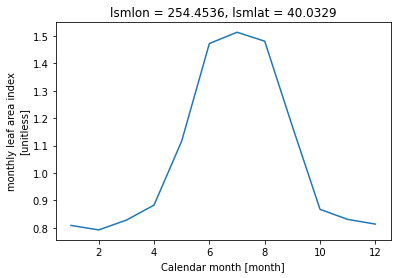

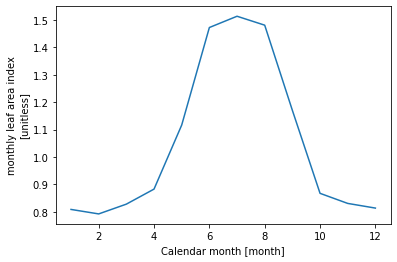

In [32]:
surDat = '/glade/p/cesmdata/inputdata/lnd/clm2/surfdata_map/release-clm5.0.18/surfdata_0.9x1.25_hist_16pfts_Irrig_CMIP6_simyr2000_c190214.nc'
surDat = xr.open_dataset(surDat)
surDat.MONTHLY_LAI.sel(lsmlon=204,lsmlat=138,lsmpft=1).plot();

In [33]:
surfdata_0.9x1.25_hist_16pfts_Irrig_CMIP6_simyr2000_US-NR1_c220922.nc surfdata_0.9x1.25_hist_16pfts_Irrig_CMIP6_simyr2000_US-NR1_LAIx2.66.nc

2.6666666666666665